# YOLO11 Segmentation Training on MVTec 3D-AD Dataset

This notebook walks through the full pipeline to train a **YOLO11 instance segmentation** model on the [MVTec 3D Anomaly Detection dataset](https://www.mvtec.com/company/research/datasets/mvtec-3d-ad).

## Dataset Overview
- **10 industrial categories**: bagel, cable_gland, carrot, cookie, dowel, foam, peach, potato, rope, tire
- **Modalities**: RGB images + XYZ point clouds (we use RGB)
- **Splits**: `train/good` (defect-free only), `test/{defect_type + good}` with GT masks, `validation/good`
- **GT masks**: Grayscale PNG â€” pixel value `0` = background, values `252â€“255` = different defect classes
- **Task**: Binary anomaly segmentation â€” detect and segment **any defect region** (1 class: `anomaly`)

## Pipeline
1. EDA â€” visualise images, masks and class distribution
2. Convert GT masks â†’ YOLO polygon labels
3. Build YOLO dataset directory + `data.yaml`
4. Train YOLO11-seg
5. Evaluate & visualise predictions

## 0. Install Dependencies

In [1]:
# Install required packages (run once)
!pip install ultralytics opencv-python-headless matplotlib numpy Pillow tqdm scikit-learn albumentations -q


[notice] A new release of pip is available: 25.3 -> 26.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## 1. Imports & Configuration

In [2]:
import os
import json
import shutil
import random
import warnings
from pathlib import Path
from collections import defaultdict

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from tqdm import tqdm
from sklearn.model_selection import train_test_split

warnings.filterwarnings('ignore')
random.seed(42)
np.random.seed(42)

# â”€â”€ Paths â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
DATASET_ROOT = Path(r'c:/Users/ilias/Downloads/mvtec_3d_anomaly_detection')
YOLO_ROOT    = DATASET_ROOT / 'yolo_dataset'   # output directory for YOLO format

CATEGORIES = [
    'bagel', 'cable_gland', 'carrot', 'cookie',
    'dowel', 'foam', 'peach', 'potato', 'rope', 'tire'
]

# â”€â”€ YOLO hyperparams â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
IMG_SIZE      = 640      # resize target for training
TRAIN_SPLIT   = 0.80     # fraction of defect images used for training
MIN_CONTOUR_AREA = 50    # ignore tiny mask fragments (pixelsÂ²)

# Class definition  (binary: 0 = anomaly)
CLASS_NAMES = ['anomaly']
CLASS_ID    = 0

print(f'Dataset root : {DATASET_ROOT}')
print(f'YOLO output  : {YOLO_ROOT}')
print(f'Categories   : {CATEGORIES}')

Dataset root : c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection
YOLO output  : c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\yolo_dataset
Categories   : ['bagel', 'cable_gland', 'carrot', 'cookie', 'dowel', 'foam', 'peach', 'potato', 'rope', 'tire']


## 2. Exploratory Data Analysis

In [3]:
# â”€â”€ 2.1  Count images per category / split / defect type â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
stats = []
for cat in CATEGORIES:
    cat_path = DATASET_ROOT / cat
    # train (good only)
    train_good = len(list((cat_path / 'train' / 'good' / 'rgb').glob('*.png')))
    # validation (good only)
    val_good   = len(list((cat_path / 'validation' / 'good' / 'rgb').glob('*.png')))
    # test  â€“ iterate over all defect folders
    defect_types = [d.name for d in (cat_path / 'test').iterdir() if d.is_dir() and d.name != 'good']
    defect_imgs  = sum(len(list((cat_path / 'test' / d / 'rgb').glob('*.png'))) for d in defect_types)
    good_test    = len(list((cat_path / 'test' / 'good' / 'rgb').glob('*.png')))

    stats.append({
        'category'    : cat,
        'train_good'  : train_good,
        'val_good'    : val_good,
        'test_good'   : good_test,
        'test_defect' : defect_imgs,
        'defect_types': defect_types
    })

print(f'{"Category":<15} {"Train(good)":>12} {"Val(good)":>10} {"Test(good)":>11} {"Test(defect)":>13} Defect types')
print('-'*85)
total_defect = 0
for s in stats:
    print(f"{s['category']:<15} {s['train_good']:>12} {s['val_good']:>10} "
          f"{s['test_good']:>11} {s['test_defect']:>13}  {s['defect_types']}")
    total_defect += s['test_defect']
print('-'*85)
print(f'Total labelled defect images: {total_defect}')

Category         Train(good)  Val(good)  Test(good)  Test(defect) Defect types
-------------------------------------------------------------------------------------
bagel                    244         22          22            88  ['combined', 'contamination', 'crack', 'hole']
cable_gland              223         23          21            87  ['bent', 'cut', 'hole', 'thread']
carrot                   286         29          27           132  ['combined', 'contamination', 'crack', 'cut', 'hole']
cookie                   210         22          28           103  ['combined', 'contamination', 'crack', 'hole']
dowel                    288         34          26           104  ['bent', 'combined', 'contamination', 'cut']
foam                     236         27          20            80  ['color', 'combined', 'contamination', 'cut']
peach                    361         42          26           106  ['combined', 'contamination', 'cut', 'hole']
potato                   300         33         

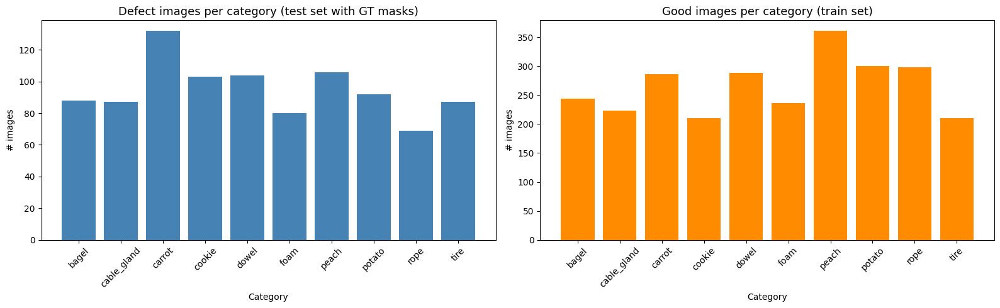

In [4]:
# â”€â”€ 2.2  Bar chart of defect image counts â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

cats = [s['category'] for s in stats]
defects = [s['test_defect'] for s in stats]
trains  = [s['train_good'] for s in stats]

axes[0].bar(cats, defects, color='steelblue')
axes[0].set_title('Defect images per category (test set with GT masks)', fontsize=13)
axes[0].set_xlabel('Category'); axes[0].set_ylabel('# images')
axes[0].tick_params(axis='x', rotation=45)

axes[1].bar(cats, trains, color='darkorange')
axes[1].set_title('Good images per category (train set)', fontsize=13)
axes[1].set_xlabel('Category'); axes[1].set_ylabel('# images')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(DATASET_ROOT / 'eda_image_counts.png', dpi=120)
plt.show()

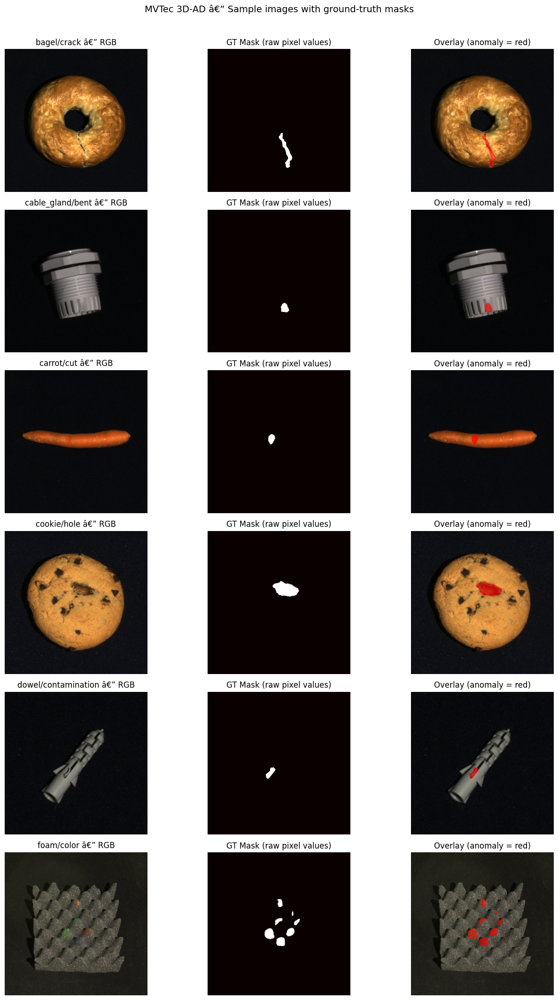

In [5]:
# â”€â”€ 2.3  Visualise sample RGB images + GT masks â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
def show_sample(cat, defect_type, idx=0):
    base = DATASET_ROOT / cat / 'test' / defect_type
    rgb_files = sorted((base / 'rgb').glob('*.png'))
    gt_files  = sorted((base / 'gt').glob('*.png'))
    if not rgb_files:
        return
    idx = idx % len(rgb_files)
    rgb = np.array(Image.open(rgb_files[idx]))
    gt  = np.array(Image.open(gt_files[idx])) if gt_files else np.zeros(rgb.shape[:2], dtype=np.uint8)

    # Overlay: colour anomaly pixels red
    overlay = rgb.copy()
    mask = gt > 0
    overlay[mask] = (overlay[mask] * 0.4 + np.array([255, 0, 0]) * 0.6).astype(np.uint8)

    return rgb, gt, overlay

sample_pairs = [
    ('bagel',       'crack'),
    ('cable_gland', 'bent'),
    ('carrot',      'cut'),
    ('cookie',      'hole'),
    ('dowel',       'contamination'),
    ('foam',        'color'),
]

fig, axes = plt.subplots(len(sample_pairs), 3, figsize=(14, 3.5 * len(sample_pairs)))
for row, (cat, defect) in enumerate(sample_pairs):
    result = show_sample(cat, defect)
    if result is None:
        continue
    rgb, gt, overlay = result
    axes[row, 0].imshow(rgb);                  axes[row, 0].set_title(f'{cat}/{defect} â€” RGB')
    axes[row, 1].imshow(gt, cmap='hot');       axes[row, 1].set_title('GT Mask (raw pixel values)')
    axes[row, 2].imshow(overlay);              axes[row, 2].set_title('Overlay (anomaly = red)')
    for ax in axes[row]:
        ax.axis('off')

plt.suptitle('MVTec 3D-AD â€” Sample images with ground-truth masks', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(DATASET_ROOT / 'eda_samples.png', dpi=100, bbox_inches='tight')
plt.show()

In [6]:
# â”€â”€ 2.4  GT mask pixel-value distribution for one category â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
print('GT mask unique pixel values per defect folder (bagel):')
for d in sorted((DATASET_ROOT / 'bagel' / 'test').iterdir()):
    gt_folder = d / 'gt'
    if not gt_folder.exists():
        continue
    vals = set()
    for f in gt_folder.glob('*.png'):
        vals |= set(np.unique(np.array(Image.open(f))))
    print(f'  {d.name:<15}: pixel values = {sorted(vals)}')

print()
print('Interpretation: 0 = background / good,  non-zero = anomaly class')

GT mask unique pixel values per defect folder (bagel):
  combined       : pixel values = [np.uint8(0), np.uint8(253), np.uint8(254), np.uint8(255)]
  contamination  : pixel values = [np.uint8(0), np.uint8(255)]
  crack          : pixel values = [np.uint8(0), np.uint8(254)]
  good           : pixel values = [np.uint8(0)]
  hole           : pixel values = [np.uint8(0), np.uint8(253)]

Interpretation: 0 = background / good,  non-zero = anomaly class


In [7]:
# â”€â”€ 2.5  Image resolution check â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
sizes = defaultdict(int)
for cat in CATEGORIES:
    for f in (DATASET_ROOT / cat / 'train' / 'good' / 'rgb').glob('*.png'):
        w, h = Image.open(f).size
        sizes[f'{w}x{h}'] += 1
        break  # one sample per category is enough

print('Observed image sizes (WxH):')
for sz, cnt in sorted(sizes.items(), key=lambda x: -x[1]):
    print(f'  {sz}: {cnt} categories')

Observed image sizes (WxH):
  800x800: 3 categories
  400x400: 2 categories
  500x500: 1 categories
  900x900: 1 categories
  600x600: 1 categories
  900x400: 1 categories
  600x800: 1 categories


## 3. GT Mask â†’ YOLO Polygon Labels

YOLO segmentation label format (one `.txt` per image):
```
<class_id>  x1 y1 x2 y2 ... xN yN
```
All coordinates are **normalised** to [0, 1]. Each row = one object instance.

In [8]:
def mask_to_yolo_polygons(mask: np.ndarray, min_area: int = MIN_CONTOUR_AREA) -> list[str]:
    """
    Convert a binary/grayscale GT mask to YOLO segmentation label lines.

    Parameters
    ----------
    mask     : HÃ—W uint8 array, non-zero pixels = anomaly
    min_area : discard contours smaller than this (noise)

    Returns
    -------
    List of label strings, one per contour:
        "0  x1 y1 x2 y2 ... xN yN"
    """
    H, W = mask.shape[:2]
    # Binarise
    binary = (mask > 0).astype(np.uint8) * 255

    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    lines = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < min_area:
            continue

        # Approximate contour to reduce point count
        epsilon = 0.002 * cv2.arcLength(cnt, True)
        approx  = cv2.approxPolyDP(cnt, epsilon, True)

        if len(approx) < 3:   # degenerate
            continue

        # Flatten and normalise
        pts = approx.reshape(-1, 2).astype(float)
        pts[:, 0] /= W
        pts[:, 1] /= H
        pts = pts.clip(0, 1)

        coords = ' '.join(f'{x:.6f} {y:.6f}' for x, y in pts)
        lines.append(f'{CLASS_ID} {coords}')

    return lines


# Quick sanity check
test_gt_path = DATASET_ROOT / 'bagel' / 'test' / 'crack' / 'gt' / '000.png'
test_gt = np.array(Image.open(test_gt_path))
lines   = mask_to_yolo_polygons(test_gt)
print(f'GT mask shape : {test_gt.shape}, unique vals: {np.unique(test_gt)}')
print(f'Generated {len(lines)} label line(s)')
if lines:
    print('First 80 chars of line 0:', lines[0][:80], '...')

GT mask shape : (800, 800), unique vals: [  0 254]
Generated 1 label line(s)
First 80 chars of line 0: 0 0.515000 0.588750 0.512500 0.591250 0.507500 0.605000 0.498750 0.610000 0.4987 ...


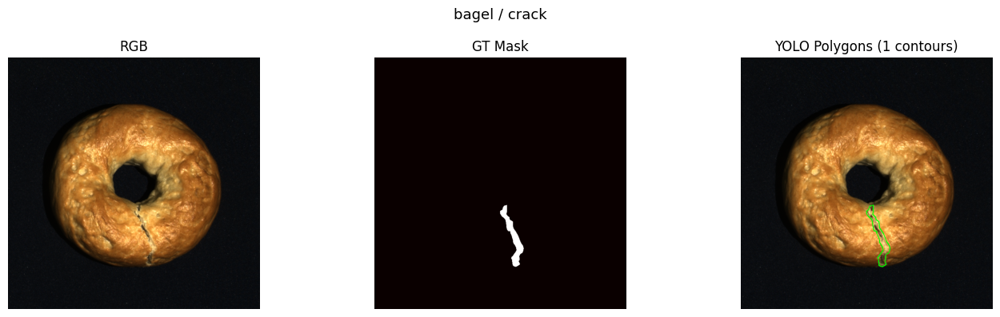

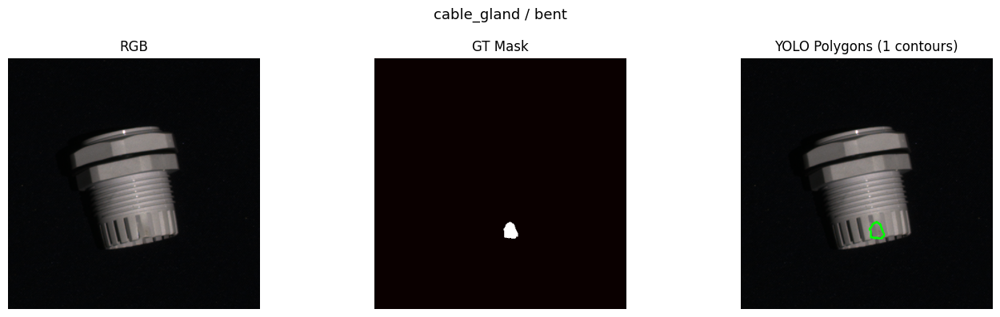

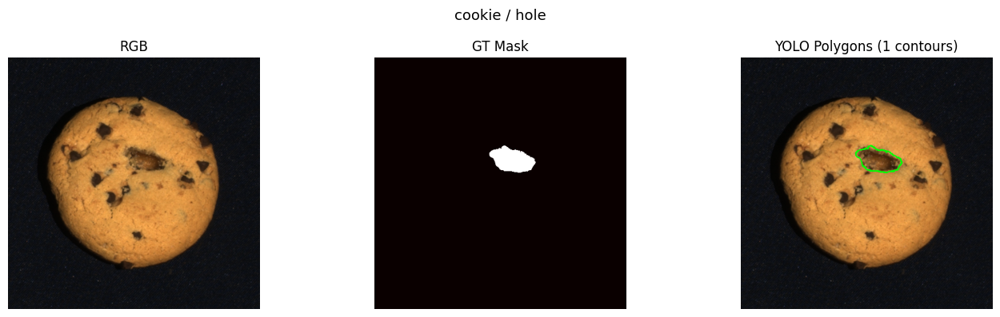

In [9]:
# â”€â”€ Visualise polygon extraction â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
def visualise_polygon_extraction(cat, defect, idx=0):
    base   = DATASET_ROOT / cat / 'test' / defect
    rgb_f  = sorted((base / 'rgb').glob('*.png'))[idx]
    gt_f   = sorted((base / 'gt' ).glob('*.png'))[idx]

    rgb  = np.array(Image.open(rgb_f))
    gt   = np.array(Image.open(gt_f))
    lines = mask_to_yolo_polygons(gt)

    H, W = gt.shape
    canvas = rgb.copy()
    for line in lines:
        parts  = line.split()
        coords = np.array(parts[1:], dtype=float).reshape(-1, 2)
        coords[:, 0] *= W
        coords[:, 1] *= H
        pts = coords.astype(np.int32).reshape((-1, 1, 2))
        cv2.polylines(canvas, [pts], True, (0, 255, 0), 2)

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    axes[0].imshow(rgb);                axes[0].set_title('RGB')
    axes[1].imshow(gt, cmap='hot');     axes[1].set_title('GT Mask')
    axes[2].imshow(canvas);             axes[2].set_title(f'YOLO Polygons ({len(lines)} contours)')
    for ax in axes: ax.axis('off')
    plt.suptitle(f'{cat} / {defect}', fontsize=13)
    plt.tight_layout()
    plt.show()

visualise_polygon_extraction('bagel',       'crack')
visualise_polygon_extraction('cable_gland', 'bent')
visualise_polygon_extraction('cookie',      'hole')

## 4. Build YOLO Dataset

Directory structure we will create:
```
yolo_dataset/
â”œâ”€â”€ images/
â”‚   â”œâ”€â”€ train/
â”‚   â””â”€â”€ val/
â”œâ”€â”€ labels/
â”‚   â”œâ”€â”€ train/
â”‚   â””â”€â”€ val/
â””â”€â”€ data.yaml
```
**Training data** = all defect images from every category (80 % train / 20 % val).  
**Label** = single class `anomaly` (binary segmentation).

In [10]:
def collect_defect_samples(dataset_root: Path, categories: list) -> list[dict]:
    """
    Walk every category/test/<defect>/rgb folder and collect
    (rgb_path, gt_path) pairs that have a non-empty GT mask.
    """
    samples = []
    for cat in categories:
        test_root = dataset_root / cat / 'test'
        for defect_dir in sorted(test_root.iterdir()):
            if not defect_dir.is_dir() or defect_dir.name == 'good':
                continue  # skip good (no GT anomaly)
            rgb_dir = defect_dir / 'rgb'
            gt_dir  = defect_dir / 'gt'
            if not rgb_dir.exists() or not gt_dir.exists():
                continue
            for rgb_f in sorted(rgb_dir.glob('*.png')):
                gt_f = gt_dir / rgb_f.name
                if not gt_f.exists():
                    continue
                # Verify the mask has at least one anomaly pixel
                gt_arr = np.array(Image.open(gt_f))
                if gt_arr.max() == 0:
                    continue
                samples.append({
                    'rgb'     : rgb_f,
                    'gt'      : gt_f,
                    'cat'     : cat,
                    'defect'  : defect_dir.name,
                })
    return samples


all_samples = collect_defect_samples(DATASET_ROOT, CATEGORIES)
print(f'Total usable defect samples (with non-empty GT): {len(all_samples)}')

# Distribution per category
from collections import Counter
per_cat = Counter(s['cat'] for s in all_samples)
for cat, cnt in sorted(per_cat.items()):
    print(f'  {cat:<15}: {cnt}')

Total usable defect samples (with non-empty GT): 948
  bagel          : 88
  cable_gland    : 87
  carrot         : 132
  cookie         : 103
  dowel          : 104
  foam           : 80
  peach          : 106
  potato         : 92
  rope           : 69
  tire           : 87


In [11]:
# â”€â”€ Train / Val split (stratified by category) â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
labels_for_split = [s['cat'] for s in all_samples]
train_samples, val_samples = train_test_split(
    all_samples,
    test_size=1 - TRAIN_SPLIT,
    random_state=42,
    stratify=labels_for_split
)
print(f'Train : {len(train_samples)} images')
print(f'Val   : {len(val_samples)}  images')

Train : 758 images
Val   : 190  images


In [12]:
def build_yolo_dataset(train_samples, val_samples, yolo_root: Path):
    """
    Write images and label files to yolo_root in YOLO segmentation format.
    Images are resized to IMG_SIZE x IMG_SIZE.
    """
    for split, samples in [('train', train_samples), ('val', val_samples)]:
        img_dir = yolo_root / 'images' / split
        lbl_dir = yolo_root / 'labels' / split
        img_dir.mkdir(parents=True, exist_ok=True)
        lbl_dir.mkdir(parents=True, exist_ok=True)

        skipped = 0
        for s in tqdm(samples, desc=f'Building {split}'):
            # Unique filename: cat_defect_original
            stem = f"{s['cat']}_{s['defect']}_{s['rgb'].stem}"

            # â”€â”€ Image â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
            rgb_arr = np.array(Image.open(s['rgb']).convert('RGB'))
            rgb_arr = cv2.resize(rgb_arr, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)
            cv2.imwrite(str(img_dir / f'{stem}.jpg'),
                        cv2.cvtColor(rgb_arr, cv2.COLOR_RGB2BGR),
                        [cv2.IMWRITE_JPEG_QUALITY, 95])

            # â”€â”€ Label â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
            gt_arr = np.array(Image.open(s['gt']))
            lines  = mask_to_yolo_polygons(gt_arr)
            if not lines:
                skipped += 1
                # Write empty label file (YOLO expects it to exist)
                (lbl_dir / f'{stem}.txt').write_text('')
                continue

            (lbl_dir / f'{stem}.txt').write_text('\n'.join(lines))

        print(f'  {split}: {len(samples)} total, {skipped} skipped (no polygon)')


# Clear previous build if it exists
if YOLO_ROOT.exists():
    shutil.rmtree(YOLO_ROOT)

build_yolo_dataset(train_samples, val_samples, YOLO_ROOT)
print(f'\nYOLO dataset written to: {YOLO_ROOT}')

Building train: 100%|██████████| 758/758 [00:15<00:00, 47.57it/s]


  train: 758 total, 1 skipped (no polygon)


Building val: 100%|██████████| 190/190 [00:03<00:00, 50.31it/s]

  val: 190 total, 0 skipped (no polygon)

YOLO dataset written to: c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\yolo_dataset


In [13]:
# â”€â”€ 4.1  Write data.yaml â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
yaml_content = f"""# MVTec 3D-AD â€” YOLO Segmentation Dataset
# Binary anomaly segmentation (1 class: anomaly)

path: {YOLO_ROOT.as_posix()}
train: images/train
val:   images/val

nc: 1
names:
  0: anomaly
"""

yaml_path = YOLO_ROOT / 'data.yaml'
yaml_path.write_text(yaml_content)
print(yaml_path.read_text())

# MVTec 3D-AD â€” YOLO Segmentation Dataset
# Binary anomaly segmentation (1 class: anomaly)

path: c:/Users/ilias/Downloads/mvtec_3d_anomaly_detection/yolo_dataset
train: images/train
val:   images/val

nc: 1
names:
  0: anomaly



In [14]:
# â”€â”€ 4.2  Sanity check label files â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
train_imgs   = list((YOLO_ROOT / 'images' / 'train').glob('*.jpg'))
train_labels = list((YOLO_ROOT / 'labels' / 'train').glob('*.txt'))
val_imgs     = list((YOLO_ROOT / 'images' / 'val').glob('*.jpg'))
val_labels   = list((YOLO_ROOT / 'labels' / 'val').glob('*.txt'))

print(f'Train images : {len(train_imgs):>5}')
print(f'Train labels : {len(train_labels):>5}')
print(f'Val   images : {len(val_imgs):>5}')
print(f'Val   labels : {len(val_labels):>5}')

# Check one label
sample_lbl = train_labels[0]
content    = sample_lbl.read_text().strip()
print(f'\nSample label ({sample_lbl.name}):')
for line in content.split('\n')[:3]:
    print(' ', line[:90], '...' if len(line) > 90 else '')

Train images :   758
Train labels :   758
Val   images :   190
Val   labels :   190

Sample label (bagel_combined_000.txt):
  0 0.455000 0.558750 0.446250 0.563750 0.440000 0.585000 0.428750 0.591250 0.426250 0.59625 ...
  0 0.307500 0.275000 0.307500 0.278750 0.306250 0.280000 0.306250 0.283750 0.307500 0.28500 ...
  0 0.631250 0.195000 0.626250 0.195000 0.620000 0.200000 0.618750 0.206250 0.623750 0.21500 ...


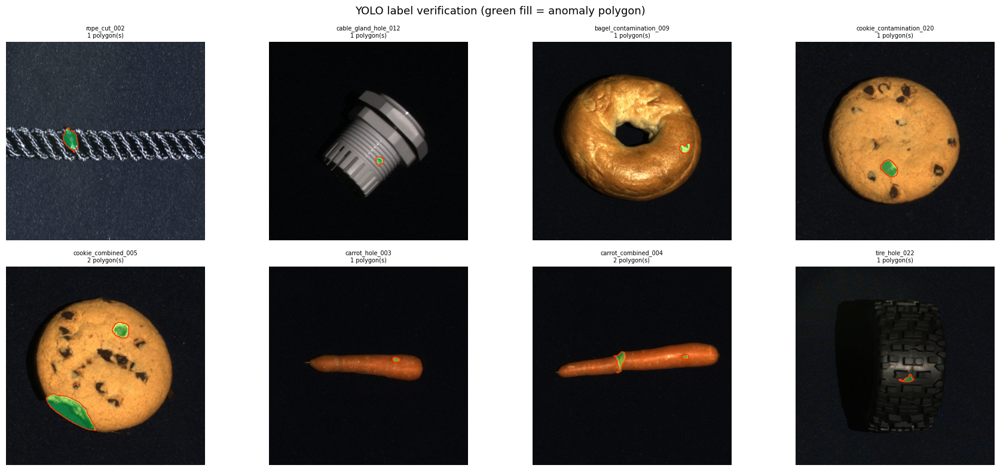

In [15]:
# â”€â”€ 4.3  Verify a batch visually (YOLO labels â†’ overlay) â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
def draw_yolo_labels(img_path: Path, lbl_path: Path):
    img  = cv2.imread(str(img_path))
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W = img.shape[:2]
    overlay = img.copy()

    content = lbl_path.read_text().strip()
    if not content:
        return img, 0

    for line in content.split('\n'):
        parts  = line.split()
        coords = np.array(parts[1:], dtype=float).reshape(-1, 2)
        coords[:, 0] *= W
        coords[:, 1] *= H
        pts = coords.astype(np.int32)
        # Fill polygon semi-transparently
        mask_layer = np.zeros_like(img)
        cv2.fillPoly(mask_layer, [pts.reshape(-1, 1, 2)], (0, 255, 100))
        overlay = cv2.addWeighted(overlay, 1.0, mask_layer, 0.4, 0)
        cv2.polylines(overlay, [pts.reshape(-1, 1, 2)], True, (255, 50, 0), 2)

    return overlay, len(content.split('\n'))


n_show = 8
sample_imgs = random.sample(train_imgs, n_show)
fig, axes = plt.subplots(2, 4, figsize=(18, 8))
axes = axes.flatten()
for ax, img_f in zip(axes, sample_imgs):
    lbl_f = YOLO_ROOT / 'labels' / 'train' / img_f.with_suffix('.txt').name
    vis, n_polys = draw_yolo_labels(img_f, lbl_f)
    ax.imshow(vis)
    ax.set_title(f'{img_f.stem[:30]}\n{n_polys} polygon(s)', fontsize=7)
    ax.axis('off')

plt.suptitle('YOLO label verification (green fill = anomaly polygon)', fontsize=13)
plt.tight_layout()
plt.savefig(DATASET_ROOT / 'yolo_label_verification.png', dpi=100)
plt.show()

## 5. Offline Data Augmentation

Because the labelled training set is small (~390 defect images after the 80/20 split), we **physically generate augmented copies** and write them to the YOLO dataset.

Key properties of this pipeline:
- Geometric and photometric transforms are applied **simultaneously** to the image and the GT mask via Albumentations
- After each transform the augmented mask is **re-converted to YOLO polygon labels** (same `mask_to_yolo_polygons` function from Section 3)
- Augmented files follow the naming convention `<stem>_aug<N>.jpg / .txt`
- Configurable multiplier: `AUG_MULTIPLIER = 5` → ×5 training set size

### Transforms used

| Group | Transforms |
|-------|------------|
| Spatial | HorizontalFlip, VerticalFlip, RandomRotate90, ShiftScaleRotate, ElasticTransform, GridDistortion, Perspective |
| Photometric | ColorJitter, RandomBrightnessContrast, CLAHE, GaussNoise, GaussianBlur, ImageCompression, ToGray |
| Coarse dropout | CoarseDropout (simulates partial occlusion / dirt) |


In [16]:
import albumentations as A

# ── Augmentation config ─────────────────────────────────────────────────────
AUG_MULTIPLIER = 5   # generate this many extra copies per training image
                     # total train images ≈ original × (1 + AUG_MULTIPLIER)

# Spatial transforms — applied identically to image AND mask
spatial_aug = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.4),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.08, scale_limit=0.15, rotate_limit=20,
        border_mode=cv2.BORDER_REFLECT_101, p=0.6
    ),
    A.ElasticTransform(
        alpha=40, sigma=5,
        border_mode=cv2.BORDER_REFLECT_101, p=0.25
    ),
    A.GridDistortion(num_steps=5, distort_limit=0.2, p=0.2),
    A.Perspective(scale=(0.03, 0.08), p=0.2),
], additional_targets={'mask': 'mask'})

# Photometric transforms — applied to image only
photo_aug = A.Compose([
    A.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.25, hue=0.06, p=0.7),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.CLAHE(clip_limit=2.5, tile_grid_size=(8, 8), p=0.25),
    A.GaussNoise(var_limit=(5.0, 40.0), p=0.3),
    A.GaussianBlur(blur_limit=(3, 5), p=0.2),
    A.ImageCompression(quality_lower=75, quality_upper=100, p=0.2),
    A.ToGray(p=0.05),          # occasional grayscale — keeps 3 channels
    A.CoarseDropout(
        max_holes=6, max_height=30, max_width=30,
        min_holes=1, min_height=8,  min_width=8,
        fill_value=0, p=0.2
    ),
])

print(f'Spatial  transforms : {len(spatial_aug.transforms)}')
print(f'Photometric transforms: {len(photo_aug.transforms)}')
print(f'AUG_MULTIPLIER = {AUG_MULTIPLIER}  →  each training image produces {AUG_MULTIPLIER} extra copies')


Spatial  transforms : 7
Photometric transforms: 8
AUG_MULTIPLIER = 5  →  each training image produces 5 extra copies


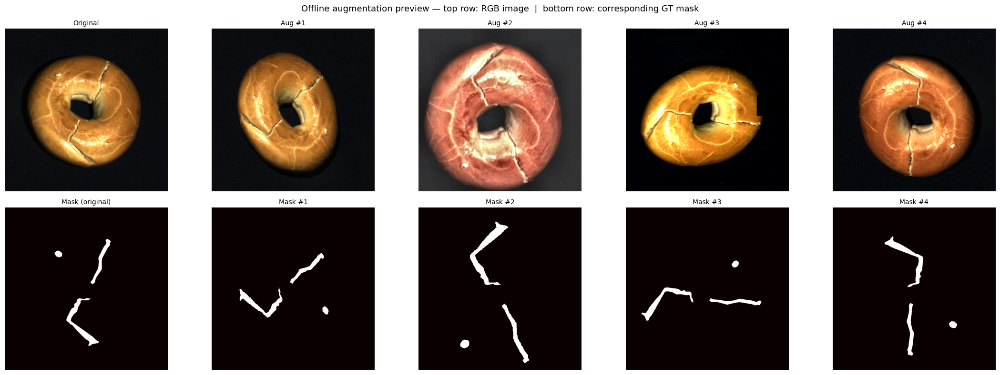

In [17]:
# ── 5.1  Visual pipeline preview ───────────────────────────────────────────
sample_img_path = train_imgs[0]
sample_lbl_path = YOLO_ROOT / 'labels' / 'train' / sample_img_path.with_suffix('.txt').name

img_orig = cv2.cvtColor(cv2.imread(str(sample_img_path)), cv2.COLOR_BGR2RGB)

# Reconstruct binary mask from the saved YOLO label
H_p, W_p  = img_orig.shape[:2]
mask_prev = np.zeros((H_p, W_p), dtype=np.uint8)
for line in sample_lbl_path.read_text().strip().split('\n'):
    if not line:
        continue
    pts = np.array(line.split()[1:], dtype=float).reshape(-1, 2)
    pts[:, 0] *= W_p
    pts[:, 1] *= H_p
    cv2.fillPoly(mask_prev, [pts.astype(np.int32)], 255)

n_cols = 5
fig, axes = plt.subplots(2, n_cols, figsize=(22, 8))

# Column 0 = original
axes[0, 0].imshow(img_orig)
axes[0, 0].set_title('Original', fontsize=10)
axes[1, 0].imshow(mask_prev, cmap='hot')
axes[1, 0].set_title('Mask (original)', fontsize=10)

for col in range(1, n_cols):
    sp       = spatial_aug(image=img_orig, mask=mask_prev)
    aug_img  = photo_aug(image=sp['image'])['image']
    aug_mask = sp['mask']

    axes[0, col].imshow(aug_img)
    axes[0, col].set_title(f'Aug #{col}', fontsize=10)
    axes[1, col].imshow(aug_mask, cmap='hot')
    axes[1, col].set_title(f'Mask #{col}', fontsize=10)

for ax in axes.flatten():
    ax.axis('off')

plt.suptitle(
    'Offline augmentation preview — top row: RGB image  |  bottom row: corresponding GT mask',
    fontsize=13
)
plt.tight_layout()
plt.savefig(DATASET_ROOT / 'augmentation_preview.png', dpi=120)
plt.show()


In [18]:
# ── 5.2  Apply augmentation and write files ─────────────────────────────────

def augment_training_set(
    train_samples: list,
    img_dir: Path,
    lbl_dir: Path,
    multiplier: int = AUG_MULTIPLIER,
) -> int:
    """
    For every sample in *train_samples*:
      1. Read the ORIGINAL full-resolution GT mask (not the YOLO .txt) for
         accurate polygon geometry.
      2. Resize to IMG_SIZE and apply spatial + photometric augmentation
         *multiplier* times independently (different random seed each time).
      3. Re-derive YOLO polygon labels from the augmented mask using the
         same mask_to_yolo_polygons() function used during dataset build.
      4. Write <stem>_aug<N>.jpg and <stem>_aug<N>.txt to img_dir / lbl_dir.

    Augmented files whose masks are wiped out by a spatial transform
    (i.e. the anomaly region was rotated/scaled out of frame) are silently
    discarded to avoid empty-label training examples.

    Returns the total number of augmented files written.
    """
    written = 0
    skipped = 0

    for s in tqdm(train_samples, desc='Augmenting train set'):
        stem = f"{s['cat']}_{s['defect']}_{s['rgb'].stem}"

        # Load original data
        img_full  = np.array(Image.open(s['rgb']).convert('RGB'))
        mask_full = np.array(Image.open(s['gt']))   # H×W uint8, non-zero = anomaly

        # Resize to training resolution
        img_res  = cv2.resize(img_full,  (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_LINEAR)
        mask_res = cv2.resize(mask_full, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)

        for aug_idx in range(multiplier):
            # 1. Spatial transform — image and mask receive identical geometry
            sp_result = spatial_aug(image=img_res, mask=mask_res)
            aug_img   = sp_result['image']
            aug_mask  = sp_result['mask']

            # 2. Photometric transform — image only, mask stays unchanged
            aug_img = photo_aug(image=aug_img)['image']

            # 3. Derive YOLO labels from augmented mask
            lines = mask_to_yolo_polygons(aug_mask)
            if not lines:
                skipped += 1
                continue  # anomaly region vanished — discard this augmentation

            # 4. Save
            out_stem = f'{stem}_aug{aug_idx:02d}'
            cv2.imwrite(
                str(img_dir / f'{out_stem}.jpg'),
                cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR),
                [cv2.IMWRITE_JPEG_QUALITY, 95],
            )
            (lbl_dir / f'{out_stem}.txt').write_text('\n'.join(lines))
            written += 1

    print(f'  Written : {written}')
    print(f'  Skipped : {skipped}  (mask vanished after spatial transform)')
    return written


n_written = augment_training_set(
    train_samples,
    img_dir=YOLO_ROOT / 'images' / 'train',
    lbl_dir=YOLO_ROOT / 'labels' / 'train',
)

total_train = len(list((YOLO_ROOT / 'images' / 'train').glob('*.jpg')))
print(f'\nTrain set before augmentation : {len(train_samples)} images')
print(f'Train set after  augmentation : {total_train} images')
print(f'Effective multiplier          : {total_train / max(len(train_samples), 1):.1f}x')


Augmenting train set: 100%|██████████| 758/758 [02:15<00:00,  5.60it/s]

  Written : 3788
  Skipped : 2  (mask vanished after spatial transform)

Train set before augmentation : 758 images
Train set after  augmentation : 4546 images
Effective multiplier          : 6.0x


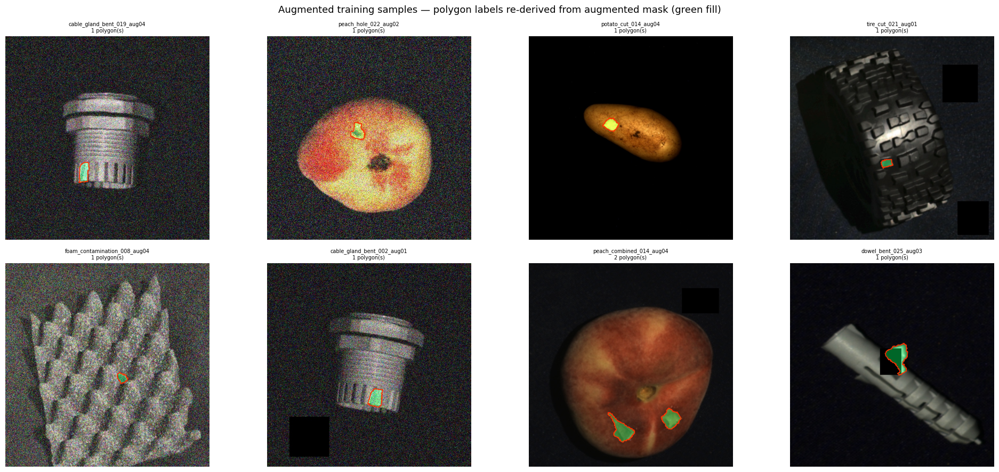

In [19]:
# ── 5.3  Spot-check augmented samples ──────────────────────────────────────
aug_imgs = sorted((YOLO_ROOT / 'images' / 'train').glob('*_aug*.jpg'))
spots    = random.sample(aug_imgs, min(8, len(aug_imgs)))

fig, axes = plt.subplots(2, 4, figsize=(20, 9))
axes = axes.flatten()

for ax, img_f in zip(axes, spots):
    lbl_f = YOLO_ROOT / 'labels' / 'train' / img_f.with_suffix('.txt').name
    vis, n_polys = draw_yolo_labels(img_f, lbl_f)
    ax.imshow(vis)
    ax.set_title(f'{img_f.stem[-28:]}\n{n_polys} polygon(s)', fontsize=7)
    ax.axis('off')

plt.suptitle(
    'Augmented training samples — polygon labels re-derived from augmented mask (green fill)',
    fontsize=13
)
plt.tight_layout()
plt.savefig(DATASET_ROOT / 'augmented_samples_verify.png', dpi=120)
plt.show()


       original  augmented  total
split                            
train       758       3788   4546
val         190          0    190


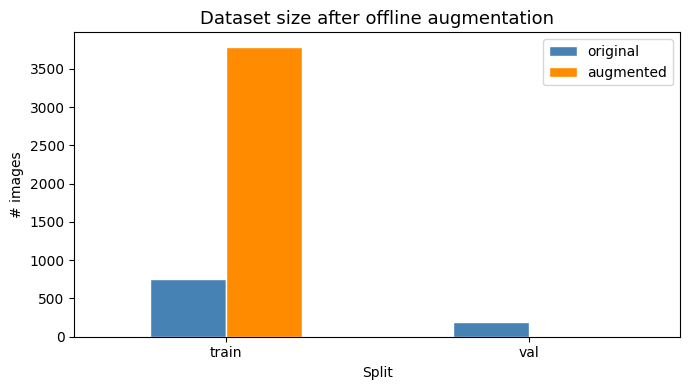

In [20]:
# ── 5.4  Final dataset size summary ────────────────────────────────────────
import pandas as pd

rows = []
for split in ('train', 'val'):
    imgs = list((YOLO_ROOT / 'images' / split).glob('*.jpg'))
    orig = [f for f in imgs if '_aug' not in f.stem]
    augs = [f for f in imgs if '_aug'  in f.stem]
    rows.append({
        'split'    : split,
        'original' : len(orig),
        'augmented': len(augs),
        'total'    : len(imgs),
    })

df_summary = pd.DataFrame(rows).set_index('split')
print(df_summary.to_string())

fig, ax = plt.subplots(figsize=(7, 4))
df_summary[['original', 'augmented']].plot(
    kind='bar', ax=ax, color=['steelblue', 'darkorange'], edgecolor='white'
)
ax.set_title('Dataset size after offline augmentation', fontsize=13)
ax.set_xlabel('Split')
ax.set_ylabel('# images')
ax.tick_params(axis='x', rotation=0)
plt.tight_layout()
plt.savefig(DATASET_ROOT / 'dataset_size_after_aug.png', dpi=120)
plt.show()


## 6. Train YOLO11 Segmentation Model

In [21]:
from ultralytics import YOLO
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {device}')
if device == 'cuda':
    print(f'GPU   : {torch.cuda.get_device_name(0)}')
    print(f'VRAM  : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB')

Device: cuda
GPU   : NVIDIA GeForce RTX 4050 Laptop GPU
VRAM  : 6.4 GB


In [22]:
# â”€â”€ Model selection â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
# Available YOLO11 segmentation weights:
#   yolo11n-seg.pt  ~2.9M params  (nano  â€” fastest, least accurate)
#   yolo11s-seg.pt  ~9.9M params  (small)
#   yolo11m-seg.pt  ~22M  params  (medium â€” good balance)
#   yolo11l-seg.pt  ~27M  params  (large)
#   yolo11x-seg.pt  ~62M  params  (xlarge â€” most accurate, slowest)

MODEL_NAME = 'yolo26n-seg.pt'   # change to 'yolo11x-seg.pt' for best quality

model = YOLO(MODEL_NAME)
print(model.info())

YOLO26n-seg summary: 309 layers, 3,126,280 parameters, 0 gradients, 10.5 GFLOPs
(309, 3126280, 0, 10.509952)


In [23]:
# â”€â”€ Training configuration â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
EPOCHS       = 150
BATCH_SIZE   = 16    # reduce to 8 if OOM on GPU, or use -1 for auto-batch
LR0          = 1e-3  # initial learning rate
LRF          = 0.01  # final lr = LR0 * LRF
PATIENCE     = 8    # early stopping patience
PROJECT_DIR  = DATASET_ROOT / 'runs' / 'segment'
RUN_NAME     = 'mvtec3d_anomaly_seg'

results = model.train(
    data      = str(yaml_path),
    epochs    = EPOCHS,
    imgsz     = IMG_SIZE,
    batch     = BATCH_SIZE,
    device    = device,
    lr0       = LR0,
    lrf       = LRF,
    patience  = PATIENCE,
    project   = str(PROJECT_DIR),
    name      = RUN_NAME,
    save      = True,
    plots     = True,
    # Augmentation (YOLO built-ins)
    mosaic    = 1.0,
    mixup     = 0.1,
    flipud    = 0.3,
    fliplr    = 0.5,
    degrees   = 10.0,
    translate = 0.1,
    scale     = 0.5,
    hsv_h     = 0.015,
    hsv_s     = 0.7,
    hsv_v     = 0.4,
    workers   = 4,
    verbose   = True,
)

print('Training complete!')

New https://pypi.org/project/ultralytics/8.4.37 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.30  Python-3.10.18 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\yolo_dataset\data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.3, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolo26n-

## 7. Training Curves

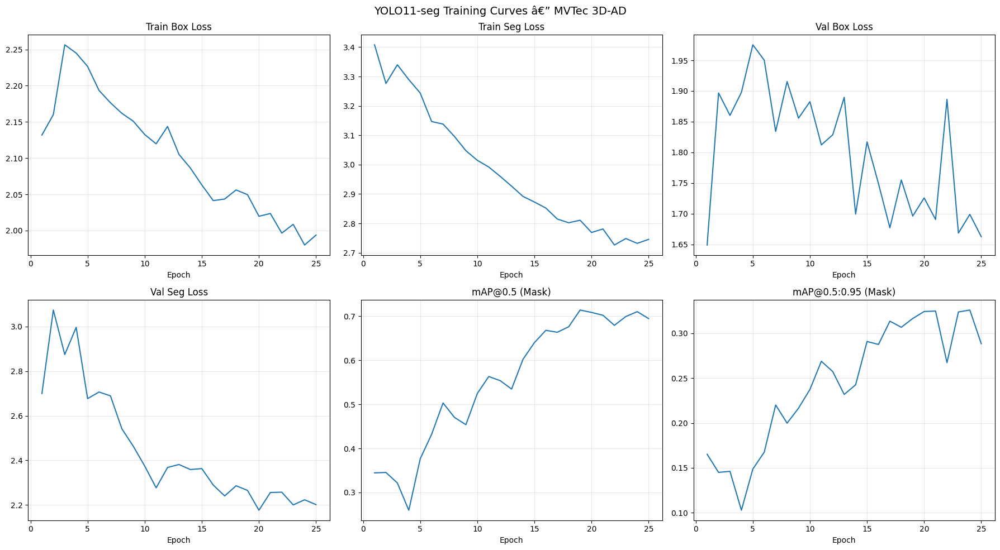

Plots saved to c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\runs\segment\mvtec3d_anomaly_seg


In [29]:
import pandas as pd

run_dir    = PROJECT_DIR / RUN_NAME
csv_path   = run_dir / 'results.csv'

df = pd.read_csv(csv_path)
df.columns = df.columns.str.strip()

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

metrics_to_plot = [
    ('train/box_loss',   'Train Box Loss'),
    ('train/seg_loss',   'Train Seg Loss'),
    ('val/box_loss',     'Val Box Loss'),
    ('val/seg_loss',     'Val Seg Loss'),
    ('metrics/mAP50(M)', 'mAP@0.5 (Mask)'),
    ('metrics/mAP50-95(M)', 'mAP@0.5:0.95 (Mask)'),
]

for ax, (col, title) in zip(axes.flatten(), metrics_to_plot):
    if col in df.columns:
        ax.plot(df['epoch'], df[col])
        ax.set_title(title, fontsize=12)
        ax.set_xlabel('Epoch')
        ax.grid(True, alpha=0.3)
    else:
        ax.set_title(f'{title} (not found)', fontsize=10)

plt.suptitle('YOLO11-seg Training Curves â€” MVTec 3D-AD', fontsize=14)
plt.tight_layout()
plt.savefig(run_dir / 'training_curves.png', dpi=120)
plt.show()
print(f'Plots saved to {run_dir}')

## 8. Evaluate on Validation Set

In [31]:
# Load best checkpoint
best_model_path = run_dir / 'weights' / 'best.pt'
best_model      = YOLO(str(best_model_path))

val_metrics = best_model.val(
    data   = str(yaml_path),
    split  = 'val',
    imgsz  = IMG_SIZE,
    device = device,
    plots  = True,
)

print('\nâ”€â”€ Validation Metrics â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€')
print(f'  Box  mAP@0.50      : {val_metrics.box.map50:.4f}')
print(f'  Box  mAP@0.50:0.95 : {val_metrics.box.map:.4f}')
print(f'  Mask mAP@0.50      : {val_metrics.seg.map50:.4f}')
print(f'  Mask mAP@0.50:0.95 : {val_metrics.seg.map:.4f}')

Ultralytics 8.4.30  Python-3.10.18 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4050 Laptop GPU, 6140MiB)
YOLO26n-seg summary (fused): 139 layers, 2,689,079 parameters, 0 gradients, 9.0 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 674.9379.2 MB/s, size: 89.6 KB)
val: Scanning C:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\yolo_dataset\labels\val.cache... 190 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 190/190  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.7it/s 4.4s0.2s
                   all        190        233      0.782      0.618      0.739      0.373      0.741      0.601      0.709      0.321
Speed: 2.5ms preprocess, 7.9ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to C:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\runs\segment\val4

â”€â”€ Validation Metrics â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€

## 9. Inference & Visualisation

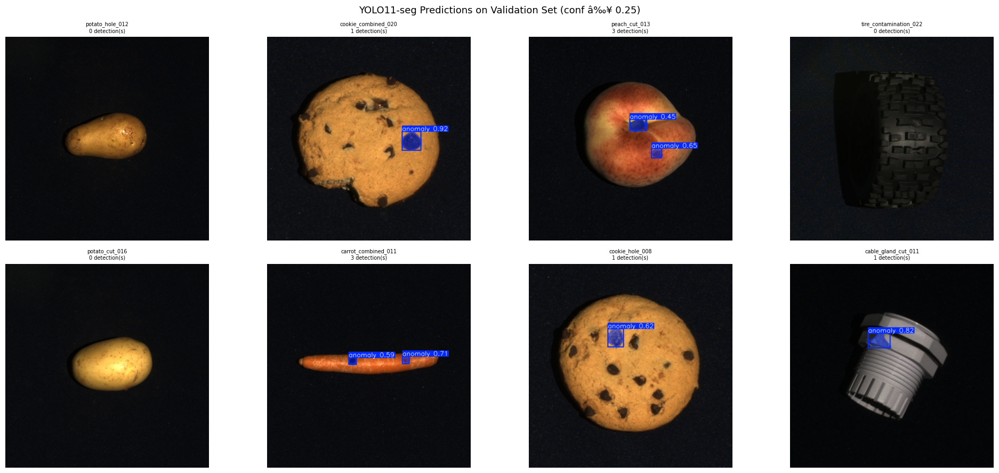

In [26]:
# Run inference on a random batch of val images
n_infer     = 8
val_img_dir = YOLO_ROOT / 'images' / 'val'
test_imgs   = random.sample(list(val_img_dir.glob('*.jpg')), n_infer)

preds = best_model.predict(
    source     = [str(p) for p in test_imgs],
    imgsz      = IMG_SIZE,
    conf       = 0.25,
    iou        = 0.45,
    device     = device,
    save       = False,
    verbose    = False,
)

fig, axes = plt.subplots(2, 4, figsize=(20, 9))
axes = axes.flatten()

for ax, (img_path, result) in zip(axes, zip(test_imgs, preds)):
    # result.plot() returns a BGR numpy array
    vis = result.plot()
    vis = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    ax.imshow(vis)
    n_det = len(result.boxes) if result.boxes is not None else 0
    ax.set_title(f'{img_path.stem[:28]}\n{n_det} detection(s)', fontsize=7)
    ax.axis('off')

plt.suptitle('YOLO11-seg Predictions on Validation Set (conf â‰¥ 0.25)', fontsize=13)
plt.tight_layout()
plt.savefig(run_dir / 'val_predictions.png', dpi=120)
plt.show()

In [27]:
# â”€â”€ Per-category performance â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€â”€
from collections import defaultdict

cat_results = defaultdict(list)

for img_path, result in zip(test_imgs, preds):
    cat = img_path.stem.split('_')[0]   # stem: bagel_crack_000
    n_det = len(result.boxes) if result.boxes is not None else 0
    confs = result.boxes.conf.cpu().numpy().tolist() if result.boxes is not None and len(result.boxes) > 0 else []
    cat_results[cat].append({'n_det': n_det, 'confs': confs})

print('Per-category inference summary (val sample):')
for cat, rows in sorted(cat_results.items()):
    avg_det  = sum(r['n_det'] for r in rows) / len(rows)
    all_conf = [c for r in rows for c in r['confs']]
    avg_conf = sum(all_conf) / len(all_conf) if all_conf else 0
    print(f'  {cat:<15}: avg detections={avg_det:.1f}, avg confidence={avg_conf:.3f}')

Per-category inference summary (val sample):
  cable          : avg detections=1.0, avg confidence=0.821
  carrot         : avg detections=3.0, avg confidence=0.531
  cookie         : avg detections=1.0, avg confidence=0.770
  peach          : avg detections=3.0, avg confidence=0.476
  potato         : avg detections=0.0, avg confidence=0.000
  tire           : avg detections=0.0, avg confidence=0.000


## 10. Export Model (Optional)

In [32]:
# Export to ONNX for deployment
best_model.export(format='onnx', imgsz=IMG_SIZE, dynamic=True, simplify=True)

# Export to TensorRT (requires NVIDIA GPU)
# best_model.export(format='engine', imgsz=IMG_SIZE, half=True)

# Export to CoreML (macOS/iOS)
# best_model.export(format='coreml', imgsz=IMG_SIZE)

print('Uncomment the export line that matches your deployment target.')
print(f'Best model weights: {best_model_path}')

Ultralytics 8.4.30  Python-3.10.18 torch-2.5.1+cu121 CPU (12th Gen Intel Core i5-12450H)

PyTorch: starting from 'c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\runs\segment\mvtec3d_anomaly_seg\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 300, 38), (1, 32, 160, 160)) (18.3 MB)

ONNX: starting export with onnx 1.20.0 opset 19...
ONNX: slimming with onnxslim 0.1.82...
ONNX: export success  8.7s, saved as 'c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\runs\segment\mvtec3d_anomaly_seg\weights\best.onnx' (11.5 MB)

Export complete (9.4s)
Results saved to C:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\runs\segment\mvtec3d_anomaly_seg\weights
Predict:         yolo predict task=segment model=c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\runs\segment\mvtec3d_anomaly_seg\weights\best.onnx imgsz=640 
Validate:        yolo val task=segment model=c:\Users\ilias\Downloads\mvtec_3d_anomaly_detection\runs\segment\mvtec3d_anomaly_seg\weights\bes

## 11. Summary

| Step | What we did |
|------|-------------|
| EDA  | Analysed 10 categories, counted images, visualised RGB + GT masks |
| Preprocessing | Converted grayscale GT masks â†’ YOLO polygon labels (cv2 contours) |
| Dataset | 80/20 stratified split, wrote YOLO directory + `data.yaml` |
| Training | Fine-tuned YOLO11m-seg (pretrained COCO), 100 epochs, mosaic + mixup augmentation |
| Evaluation | mAP@0.5 (mask) and mAP@0.5:0.95 on val set |
| Inference | Visualised predictions on unseen val images |

### Tips to improve performance
- **Scale up**: use `yolo11x-seg.pt` if GPU memory allows
- **More epochs**: increase to 200 with cosine LR schedule
- **Multi-class**: encode each defect type as a separate class (see `class_ids.json`)
- **Test-time augmentation**: add `augment=True` in `.predict()`
- **Threshold tuning**: adjust `conf` and `iou` based on your precision/recall trade-off needs
- **XYZ fusion**: concatenate depth channel (from XYZ tiff) as a 4th input channel for better spatial reasoning